In [1]:
import os
import string
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

### Let's get the stop words

In [2]:
# from the standard library
stopwords_st = set(STOPWORDS)

In [3]:
len(stopwords_st)

192

In [4]:
stopwords_st

{'a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'all',
 'also',
 'am',
 'an',
 'and',
 'any',
 'are',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 "can't",
 'cannot',
 'com',
 'could',
 "couldn't",
 'did',
 "didn't",
 'do',
 'does',
 "doesn't",
 'doing',
 "don't",
 'down',
 'during',
 'each',
 'else',
 'ever',
 'few',
 'for',
 'from',
 'further',
 'get',
 'had',
 "hadn't",
 'has',
 "hasn't",
 'have',
 "haven't",
 'having',
 'he',
 "he'd",
 "he'll",
 "he's",
 'hence',
 'her',
 'here',
 "here's",
 'hers',
 'herself',
 'him',
 'himself',
 'his',
 'how',
 "how's",
 'however',
 'http',
 'i',
 "i'd",
 "i'll",
 "i'm",
 "i've",
 'if',
 'in',
 'into',
 'is',
 "isn't",
 'it',
 "it's",
 'its',
 'itself',
 'just',
 'k',
 "let's",
 'like',
 'me',
 'more',
 'most',
 "mustn't",
 'my',
 'myself',
 'no',
 'nor',
 'not',
 'of',
 'off',
 'on',
 'once',
 'only',
 'or',
 'other',
 'otherwise',
 'ought',
 'our',
 

In [5]:
# from the file
# file 'stopwords_en.txt' should be added in the same directory where this file is located
with open('stopwords_en.txt', 'r') as f:
    lines = f.readlines()

stopwords = [line.rstrip('\n') for line in lines]

In [6]:
len(stopwords)

568

In [7]:
stopwords[0:10]

['a',
 "a's",
 'able',
 'about',
 'above',
 'according',
 'accordingly',
 'across',
 'actually',
 'after']

The file has a larger number of stop words, we will use it to filter the text.

### Let's define the function word_cloud to generate the world cloud

In [8]:
def word_cloud(actor):
    dir_descriptions = 'movies_descriptions'
    txt_file_description = actor + '.txt'
    path = os.path.join(dir_descriptions, txt_file_description)
    
    try:
        with open(path) as f:
            content = f.readlines()
    except Exception:
        print(f'Error: no files for the {actor} were found')

    if len(content) != 0:   
        # change to lower case
        # remove punctuiation
        # merge in one text
        text = " ".join(review.lower().translate(str.maketrans('', '', string.punctuation)) for review in content)

        # generate cloud filtering stopwords
        # accept combinations from 2 words
        wordcloud = WordCloud(background_color="white",
                              stopwords=stopwords,
                              width=1200, 
                              height=800,
                              collocations=True,
                              normalize_plurals=True,
                              prefer_horizontal=0.5,
                              collocation_threshold=10,
                              min_word_length=3,
                              max_words=500, # default 200
                              contour_color='firebrick'
        ).generate(text)

        # get words dictionary
        text_dictionary = wordcloud.process_text(text)
        # sort the dictionary
        word_freq = {k: v for k, v in sorted(text_dictionary.items(),reverse=True, key=lambda item: item[1])}

        #print results
        print('\n--------------------')
        print(f'Top 5 words for {actor}: \n\n {list(word_freq.items())[:5]}')
        print('\n--------------------')
        
        # plot cloud
        print(f'Words cloud for {actor}:')
        plt.figure(figsize=[14,10])
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.show()

In [18]:
def word_cloud(file):
    with open(file) as f:
        content = f.readlines()

    if len(content) != 0:   
        # merge in one text
        text = " ".join(decription for decription in content)

        wordcloud = WordCloud(background_color="white",
                              stopwords=stopwords,
                              contour_color='firebrick'
        ).generate(text)

        # plot cloud
        plt.figure(figsize=[14,10])
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.show()

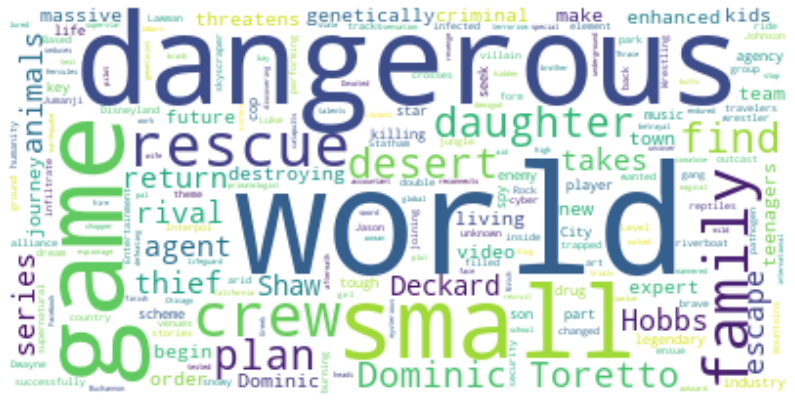

In [19]:
word_cloud('Dwayne_Johnson.txt')

### Let's plot the words clouds for all actors

In [9]:
actors_list = [('Dwayne Johnson', 'https://www.imdb.com/name/nm0425005/'),
               ('Chris Hemsworth', 'https://www.imdb.com/name/nm1165110/'),
               ('Robert Downey Jr.', 'https://www.imdb.com/name/nm0000375/'),
               ('Akshay Kumar', 'https://www.imdb.com/name/nm0474774/'),
               ('Jackie Chan', 'https://www.imdb.com/name/nm0000329/'),
               ('Bradley Cooper', 'https://www.imdb.com/name/nm0177896/'),
               ('Adam Sandler', 'https://www.imdb.com/name/nm0001191/'),
               ('Scarlett Johansson', 'https://www.imdb.com/name/nm0424060/'),
               ('Sofia Vergara', 'https://www.imdb.com/name/nm0005527/'),
               ('Chris Evans', 'https://www.imdb.com/name/nm0262635/')]


--------------------
Top 5 words for Dwayne Johnson: 

 [('dangerous', 5), ('world', 5), ('dominic toretto', 3), ('rival', 2), ('animals', 2)]

--------------------
Words cloud for Dwayne Johnson:


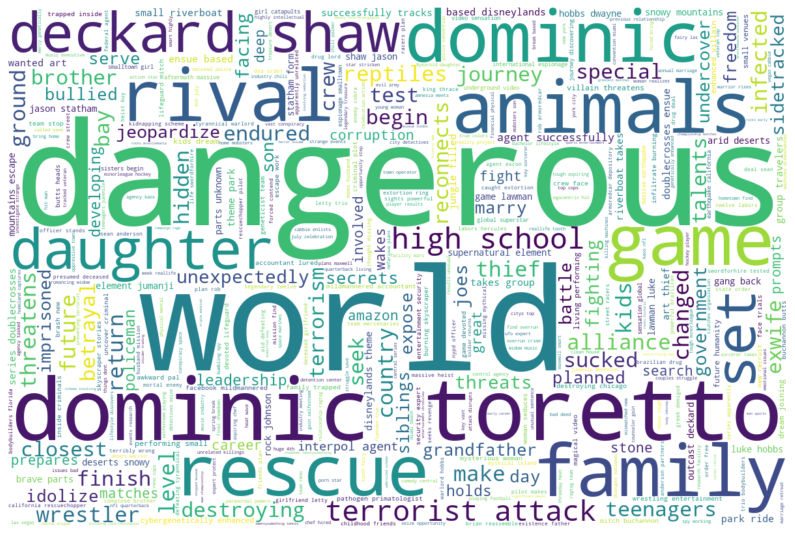


--------------------
Top 5 words for Chris Hemsworth: 

 [('new', 6), ('stop', 5), ('universe', 5), ('thor', 4), ('avengers', 4)]

--------------------
Words cloud for Chris Hemsworth:


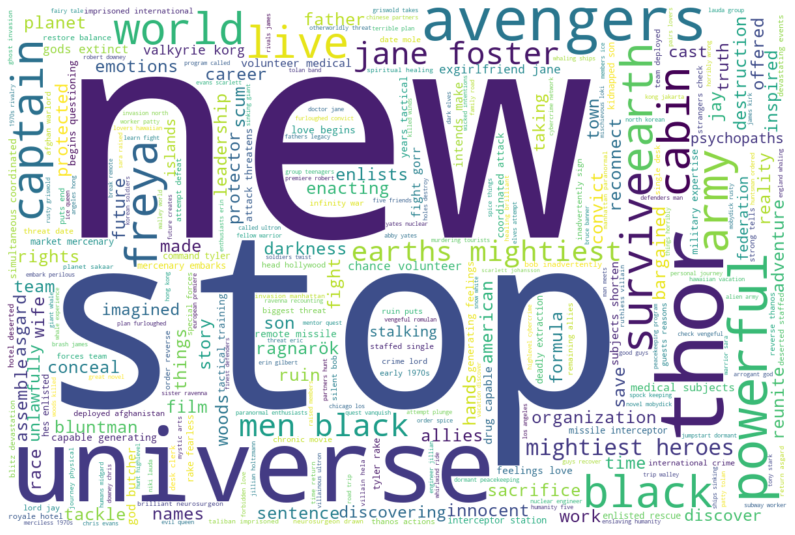


--------------------
Top 5 words for Robert Downey Jr.: 

 [('new', 10), ('man', 7), ('friend', 5), ('falls love', 5), ('high school', 4)]

--------------------
Words cloud for Robert Downey Jr.:


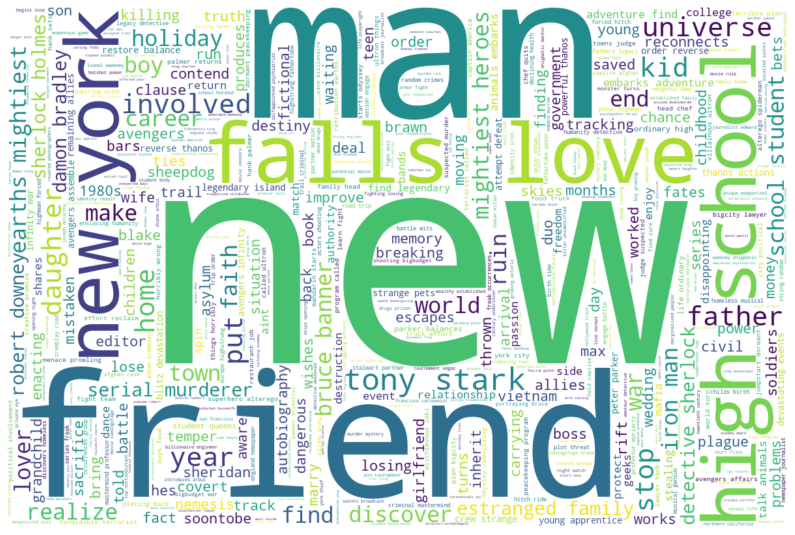


--------------------
Top 5 words for Akshay Kumar: 

 [('love', 18), ('man', 18), ('film', 18), ('find', 13), ('father', 13)]

--------------------
Words cloud for Akshay Kumar:


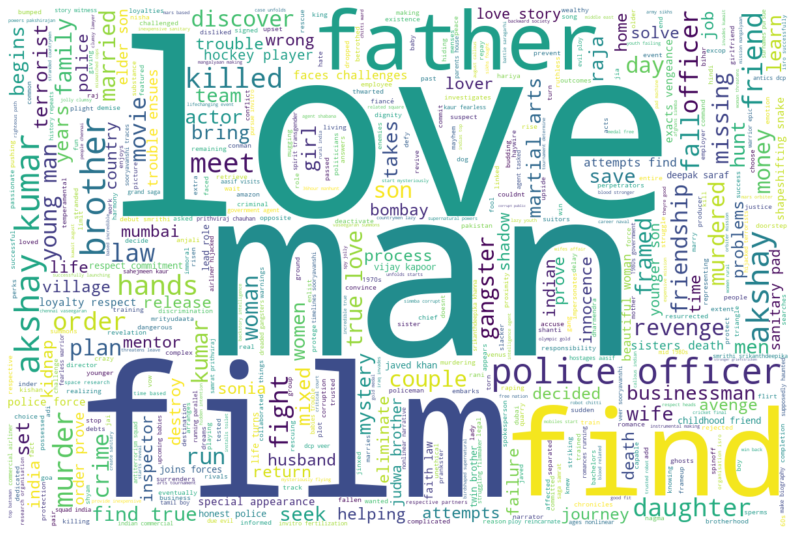


--------------------
Top 5 words for Jackie Chan: 

 [('hong kong', 25), ('movie', 21), ('martial art', 17), ('jackie chan', 13), ('film', 12)]

--------------------
Words cloud for Jackie Chan:


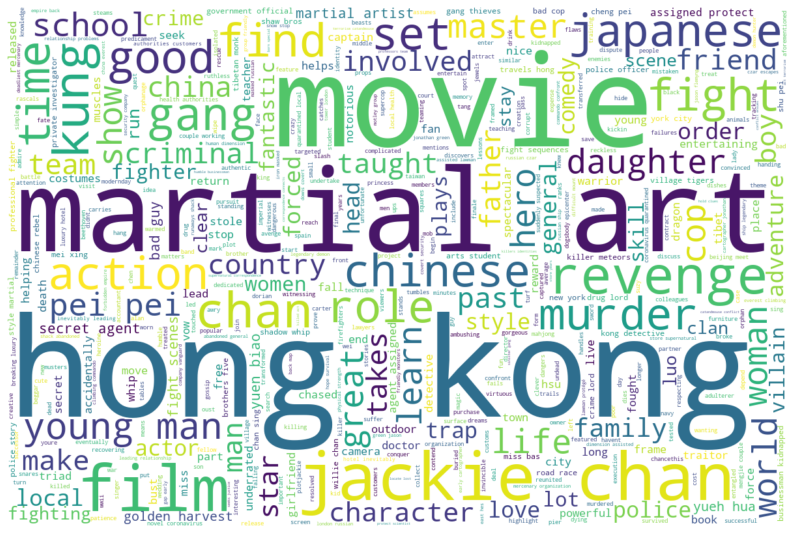


--------------------
Top 5 words for Bradley Cooper: 

 [('love', 5), ('find', 5), ('wedding', 3), ('true', 2), ('leave', 2)]

--------------------
Words cloud for Bradley Cooper:


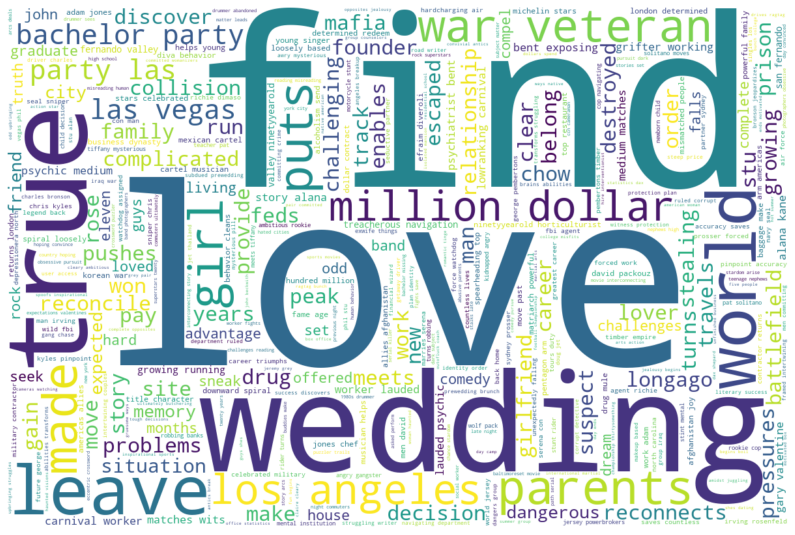


--------------------
Top 5 words for Adam Sandler: 

 [('find', 9), ('man', 7), ('family', 5), ('new york', 5), ('back', 4)]

--------------------
Words cloud for Adam Sandler:


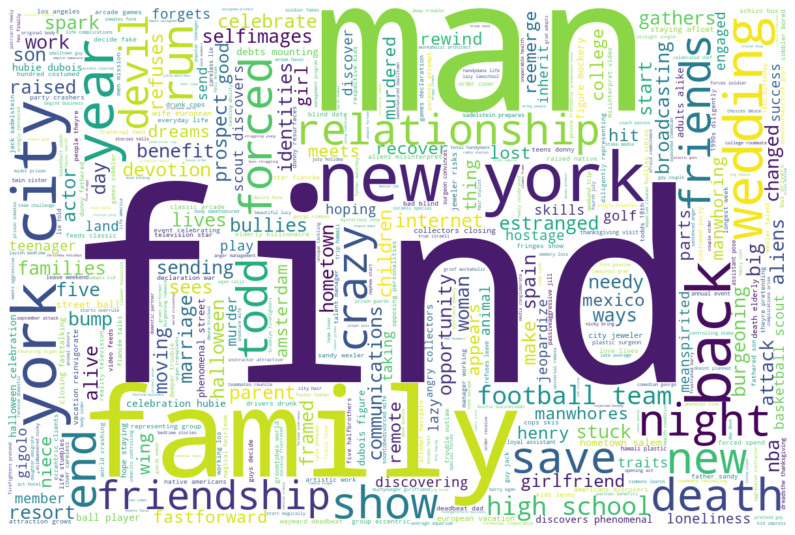


--------------------
Top 5 words for Scarlett Johansson: 

 [('young', 7), ('new', 7), ('friend', 6), ('avenger', 6), ('family', 5)]

--------------------
Words cloud for Scarlett Johansson:


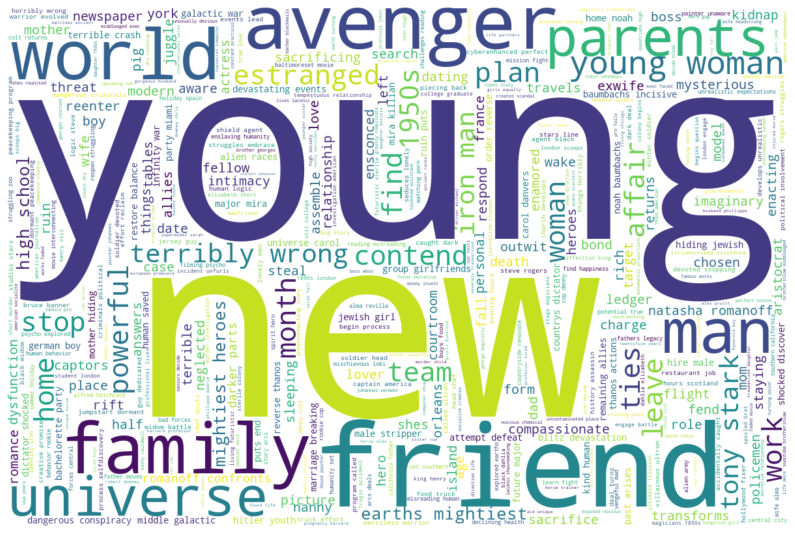


--------------------
Top 5 words for Sofia Vergara: 

 [('decide', 4), ('couple', 3), ('cop', 3), ('murder', 3), ('family', 3)]

--------------------
Words cloud for Sofia Vergara:


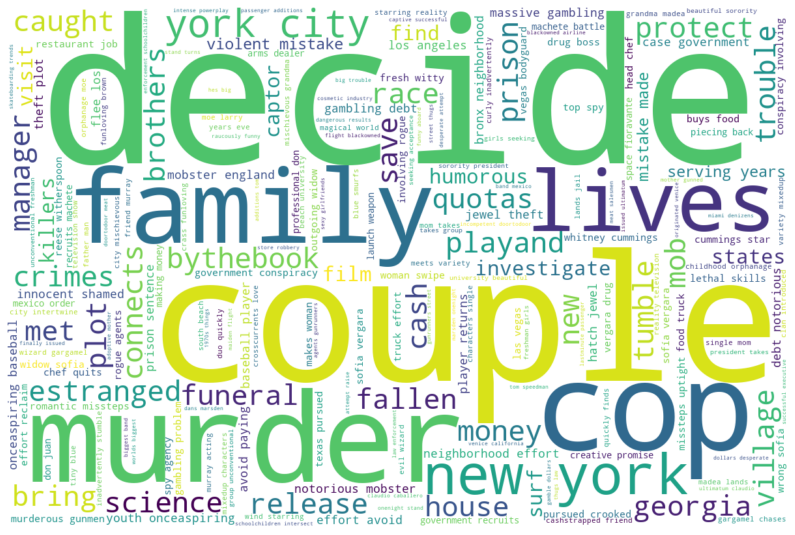


--------------------
Top 5 words for Chris Evans: 

 [('new', 7), ('universe', 6), ('avenger', 6), ('man', 3), ('new york', 3)]

--------------------
Words cloud for Chris Evans:


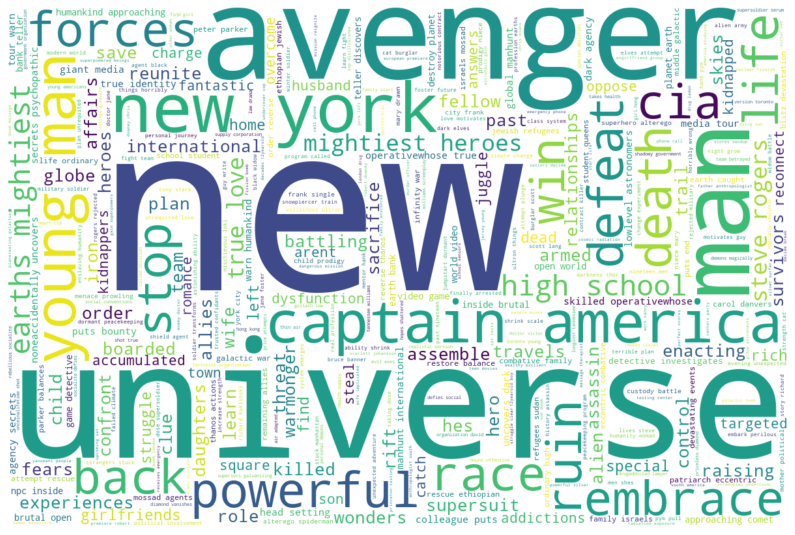

In [10]:
for actor in actors_list:
    word_cloud(actor[0])

### Combunations of two words are not allowed + standard library for stopwords

In [11]:
def word_cloud2(actor):
    dir_descriptions = 'movies_descriptions'
    txt_file_description = actor + '.txt'
    path = os.path.join(dir_descriptions, txt_file_description)
    
    try:
        with open(path) as f:
            content = f.readlines()
    except Exception:
        print(f'Error: no files for the {actor} were found')

    if len(content) != 0:   
        # change to lower case
        # remove punctuiation
        # merge in one text
        text = " ".join(review.lower().translate(str.maketrans('', '', string.punctuation)) for review in content)

        # generate cloud filtering stopwords
        # accept combinations from 2 words
        wordcloud = WordCloud(background_color="white",
                              stopwords=stopwords_st,
                              width=1200, 
                              height=800,
                              collocations=False,
                              normalize_plurals=True,
                              prefer_horizontal=0.5,
                              min_word_length=3,
                              max_words=500, # default 200
                              contour_color='firebrick'
        ).generate(text)

        # get words dictionary
        text_dictionary = wordcloud.process_text(text)
        # sort the dictionary
        word_freq = {k: v for k, v in sorted(text_dictionary.items(),reverse=True, key=lambda item: item[1])}

        #print results
        print('\n--------------------')
        print(f'Top 5 words for {actor}: \n\n {list(word_freq.items())[:5]}')
        print('\n--------------------')
        
        # plot cloud
        print(f'Words cloud for {actor}:')
        plt.figure(figsize=[14,10])
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.show()


--------------------
Top 5 words for Dwayne Johnson: 

 [('dangerous', 5), ('world', 5), ('dominic', 5), ('game', 4), ('rock', 4)]

--------------------
Words cloud for Dwayne Johnson:


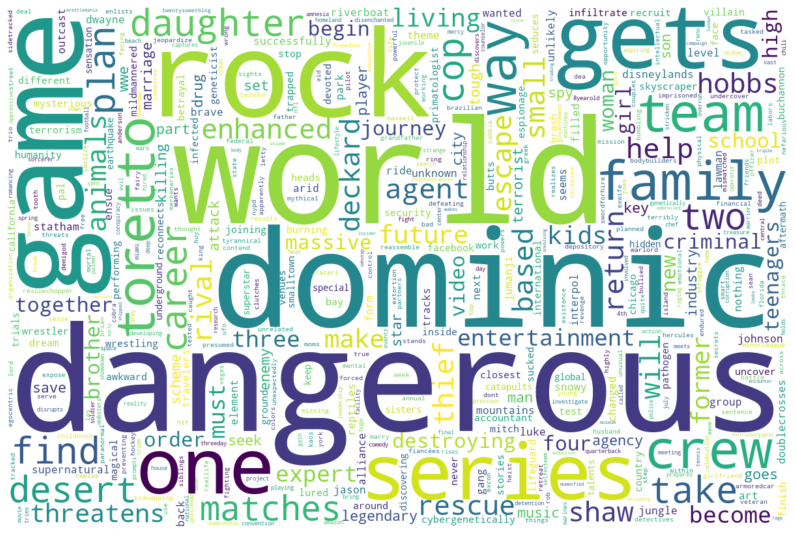


--------------------
Top 5 words for Chris Hemsworth: 

 [('new', 6), ('must', 6), ('one', 5), ('stop', 5), ('universe', 5)]

--------------------
Words cloud for Chris Hemsworth:


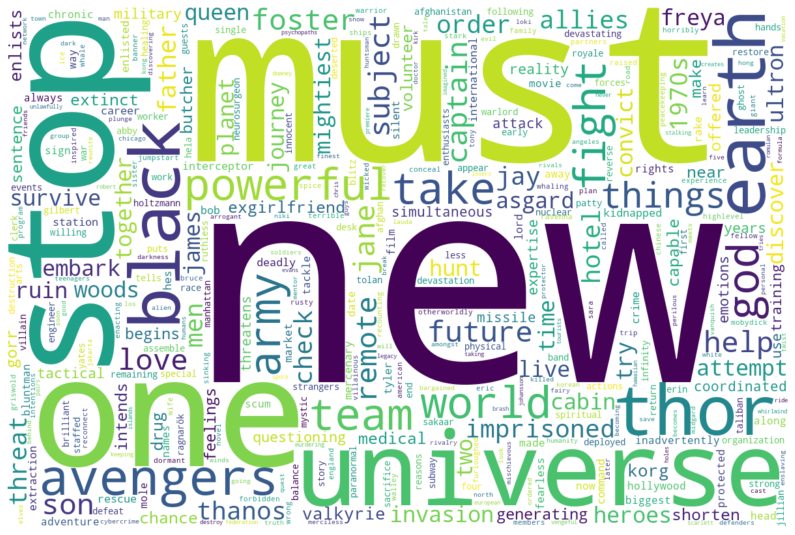


--------------------
Top 5 words for Robert Downey Jr.: 

 [('new', 14), ('man', 9), ('become', 8), ('must', 7), ('love', 7)]

--------------------
Words cloud for Robert Downey Jr.:


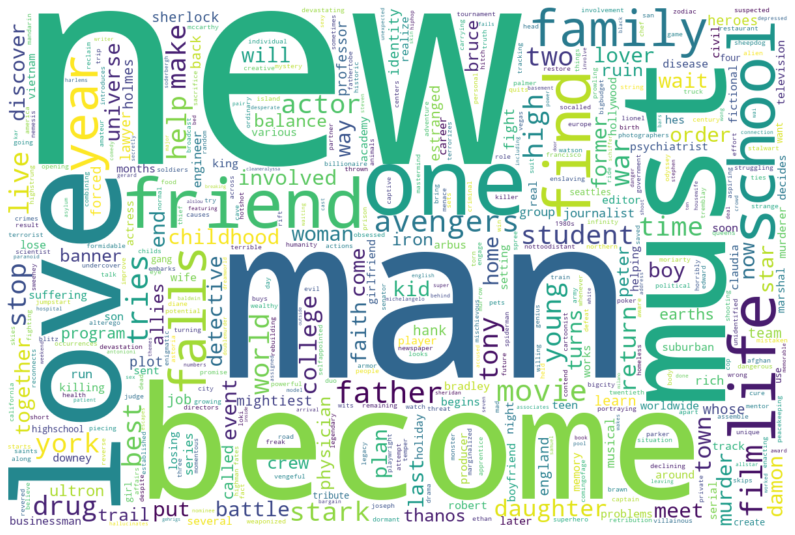


--------------------
Top 5 words for Akshay Kumar: 

 [('love', 24), ('man', 22), ('find', 18), ('film', 18), ('akshay', 17)]

--------------------
Words cloud for Akshay Kumar:


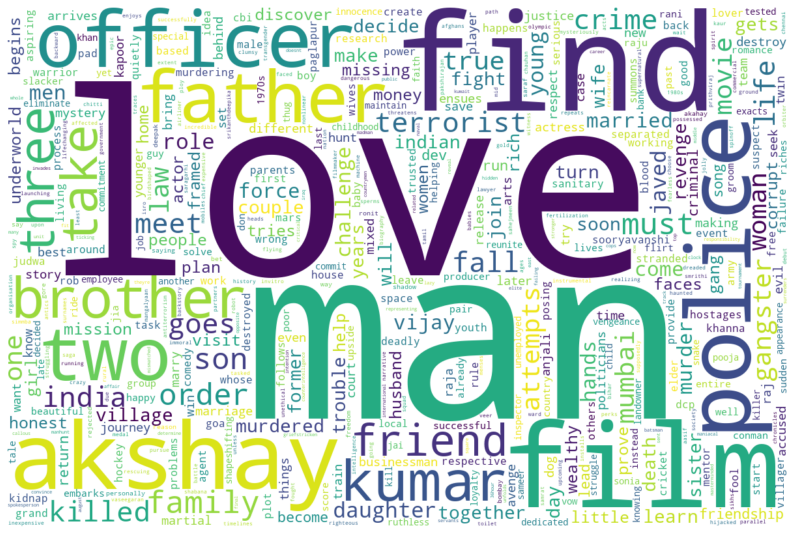


--------------------
Top 5 words for Jackie Chan: 

 [('hong', 26), ('kong', 25), ('chan', 24), ('martial', 22), ('movie', 21)]

--------------------
Words cloud for Jackie Chan:


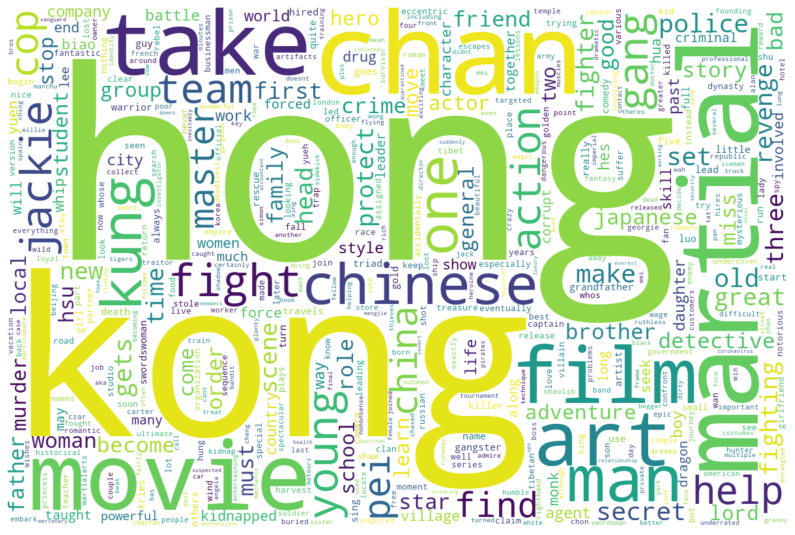


--------------------
Top 5 words for Bradley Cooper: 

 [('way', 5), ('love', 5), ('find', 5), ('two', 5), ('story', 4)]

--------------------
Words cloud for Bradley Cooper:


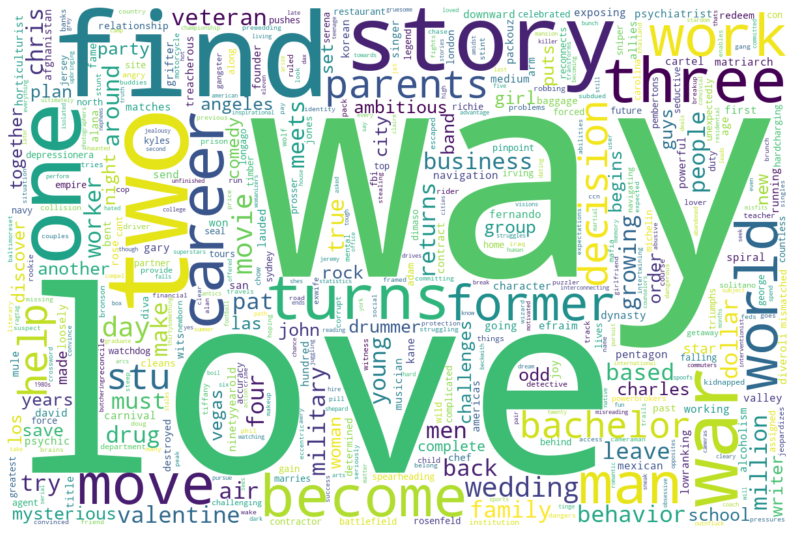


--------------------
Top 5 words for Adam Sandler: 

 [('find', 9), ('new', 7), ('man', 7), ('two', 6), ('together', 6)]

--------------------
Words cloud for Adam Sandler:


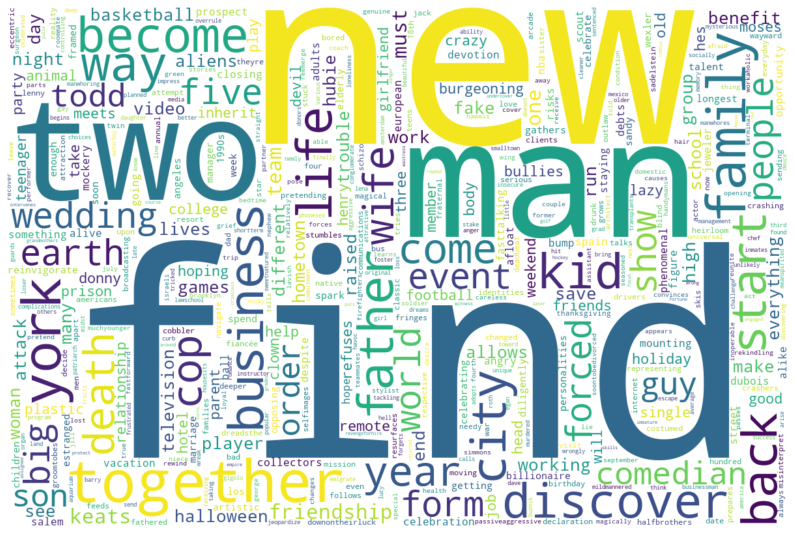


--------------------
Top 5 words for Scarlett Johansson: 

 [('young', 10), ('two', 8), ('new', 7), ('friend', 6), ('man', 6)]

--------------------
Words cloud for Scarlett Johansson:


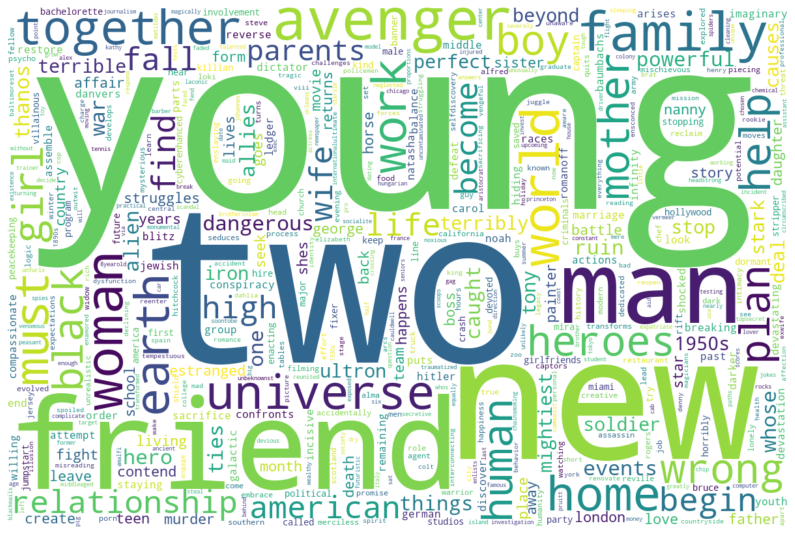


--------------------
Top 5 words for Sofia Vergara: 

 [('decide', 4), ('couple', 3), ('cop', 3), ('murder', 3), ('family', 3)]

--------------------
Words cloud for Sofia Vergara:


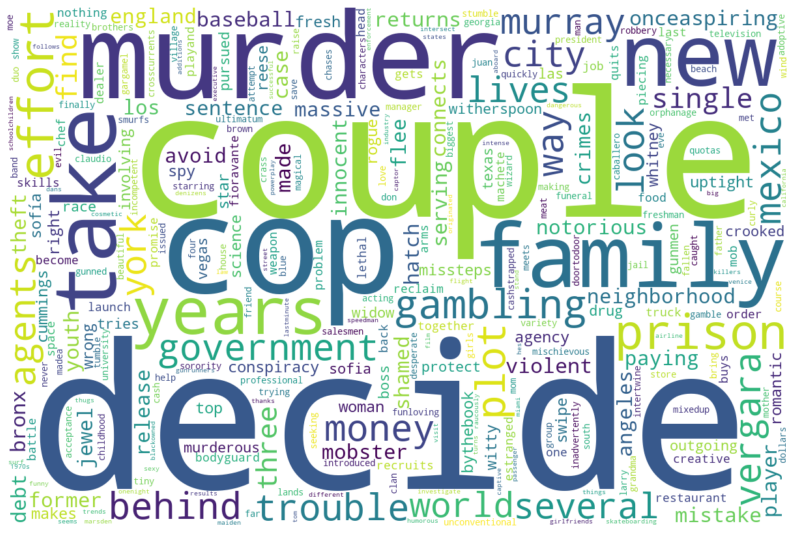


--------------------
Top 5 words for Chris Evans: 

 [('new', 10), ('must', 9), ('universe', 6), ('man', 6), ('avenger', 6)]

--------------------
Words cloud for Chris Evans:


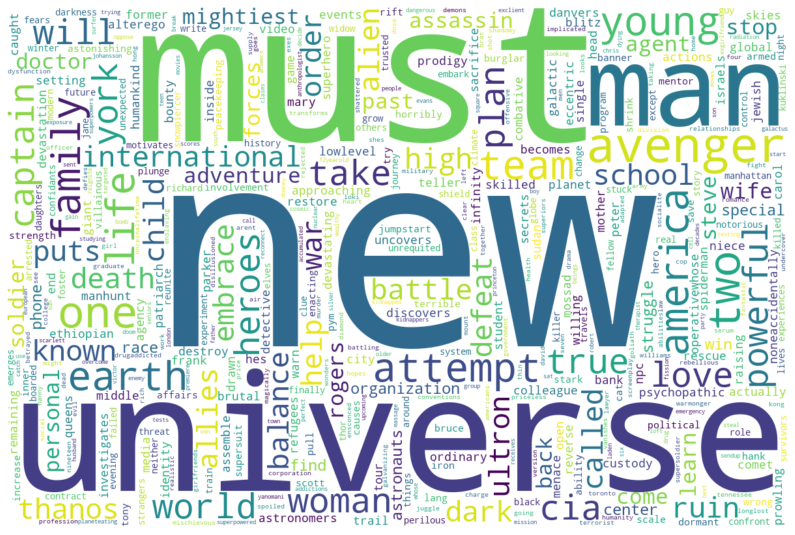

In [12]:
for actor in actors_list:
    word_cloud2(actor[0])